In [1]:
# import all libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import kagglehub
import cv2
import mediapipe as mp
from mediapipe.framework.formats import landmark_pb2
from pathlib import Path
from multiprocessing import Pool, cpu_count
import cupy as cp
from concurrent.futures import ThreadPoolExecutor

## 1. Data Collection

In [13]:
# setup kagglehub
kagglehub.login()
os.environ['KAGGLEHUB_CACHE'] = os.getcwd() + "/data/"


Kaggle credentials set.


In [ ]:
# Download Dataset
dataset_path = kagglehub.dataset_download("toxicmender/20bn-jester")
dataset_path

Resuming download from 6339690496 bytes (6472088266 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/toxicmender/20bn-jester?dataset_version_number=3 (6339690496/12811778762) bytes left.


100%|██████████| 11.9G/11.9G [1:37:38<00:00, 1.10MB/s] 

Extracting files...


In [2]:
dataset_path = os.path.join(os.getcwd(), "data", "datasets", "toxicmender", "20bn-jester", "versions", "3")
print(dataset_path)
print(os.listdir(dataset_path))

e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3
['Test', 'Test.csv', 'Train', 'Train.csv', 'Validation', 'Validation.csv']


## 2. Data Exploration

In [3]:
# load all 3 csv metadata files
train_df = pd.read_csv(os.path.join(dataset_path, "Train.csv"))
val_df = pd.read_csv(os.path.join(dataset_path, "Validation.csv"))
test_df = pd.read_csv(os.path.join(dataset_path, "Test.csv"))

In [4]:
# print stats of train_df
train_df.tail()

,video_id,label,frames,label_id,shape,format
50415,148084,No gesture,37,2,"(100, 176)",JPEG
50416,148085,Drumming Fingers,37,1,"(100, 176)",JPEG
50417,148088,Sliding Two Fingers Up,37,13,"(100, 176)",JPEG
50418,148090,Swiping Left,37,16,"(100, 176)",JPEG
50419,148092,Pulling Two Fingers In,37,4,"(100, 176)",JPEG


In [5]:
# print stats of val_df
val_df.describe()

,video_id,frames,label_id
count,7047.000000,7047.0,7047.000000
mean,73746.899248,37.0,12.079183
std,42615.127783,0.0,8.226342
min,22.000000,37.0,0.000000
25%,36857.000000,37.0,5.000000
50%,74076.000000,37.0,12.000000
75%,110391.500000,37.0,19.000000
max,148071.000000,37.0,26.000000


In [6]:
# print stats of test_df
test_df.describe()

,id,label,frames,label_id
count,6981.000000,0.0,6981.0,0.0
mean,74454.455809,NaN,37.0,NaN
std,42787.890293,NaN,0.0,NaN
min,2.000000,NaN,37.0,NaN
25%,37377.000000,NaN,37.0,NaN
50%,75131.000000,NaN,37.0,NaN
75%,111186.000000,NaN,37.0,NaN
max,148073.000000,NaN,37.0,NaN


In [7]:
# Extract unique labels from train_df
unique_labels = train_df['label'].unique()
N_CLASSES = len(unique_labels)
print(f"Number of hand gesture classes: {len(unique_labels)}")
print("Hand gesture classes:")
for i, label in enumerate(sorted(unique_labels)):
    print(f"{i}: {label}")

# Create a label mapping dictionary
label_to_id = {label: idx for idx, label in enumerate(sorted(unique_labels))}
id_to_label = {idx: label for label, idx in label_to_id.items()}

print(f"\nLabel mapping:")
for label_id, label in id_to_label.items():
    print(f"{label_id}: {label}")

Number of hand gesture classes: 27
Hand gesture classes:
0: Doing other things
1: Drumming Fingers
2: No gesture
3: Pulling Hand In
4: Pulling Two Fingers In
5: Pushing Hand Away
6: Pushing Two Fingers Away
7: Rolling Hand Backward
8: Rolling Hand Forward
9: Shaking Hand
10: Sliding Two Fingers Down
11: Sliding Two Fingers Left
12: Sliding Two Fingers Right
13: Sliding Two Fingers Up
14: Stop Sign
15: Swiping Down
16: Swiping Left
17: Swiping Right
18: Swiping Up
19: Thumb Down
20: Thumb Up
21: Turning Hand Clockwise
22: Turning Hand Counterclockwise
23: Zooming In With Full Hand
24: Zooming In With Two Fingers
25: Zooming Out With Full Hand
26: Zooming Out With Two Fingers

Label mapping:
0: Doing other things
1: Drumming Fingers
2: No gesture
3: Pulling Hand In
4: Pulling Two Fingers In
5: Pushing Hand Away
6: Pushing Two Fingers Away
7: Rolling Hand Backward
8: Rolling Hand Forward
9: Shaking Hand
10: Sliding Two Fingers Down
11: Sliding Two Fingers Left
12: Sliding Two Fingers Righ

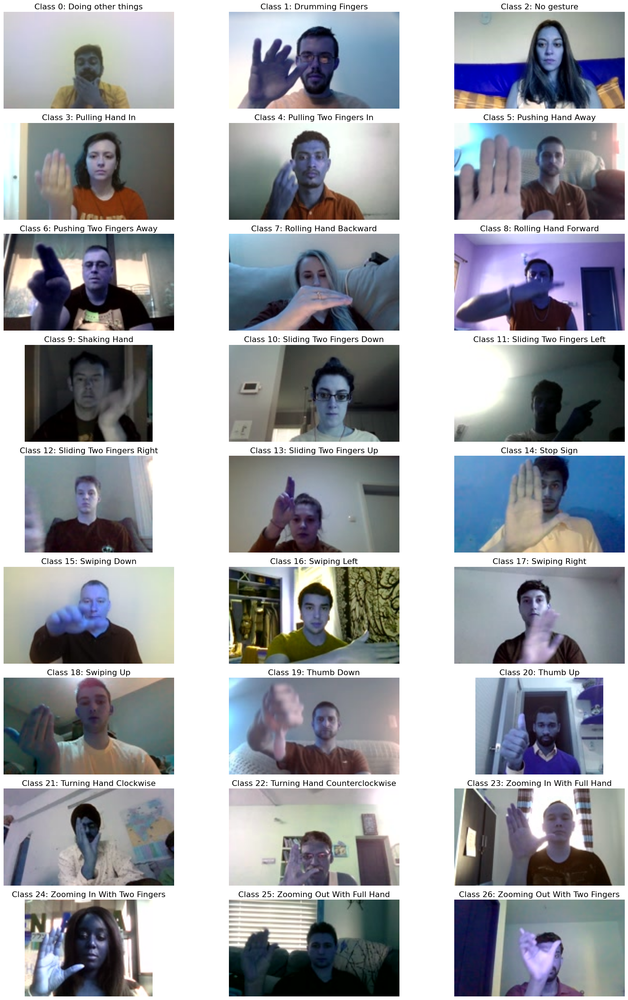

In [13]:
# show one frame(the middle one each has 37 frames so 18th frame) for each class
class_frames = []
# get the middle frame of each class take only one video from each class
for class_id in range(N_CLASSES):
    class_videos = train_df[train_df['label_id'] == class_id]
    class_videos = class_videos.sample(n=1)
    frame_path_dir = os.path.join(dataset_path, "Train", f"{class_videos['video_id'].iloc[0]}")
    # get the 8th frame file jpg
    frame_paths = [os.path.join(frame_path_dir, f) for f in os.listdir(frame_path_dir) if f.endswith('.jpg')]
    frame = cv2.imread(frame_paths[18], cv2.IMREAD_COLOR)
    class_frames.append(frame)

# plot the class frames in a grid # zoom in a little bit
fig, axes = plt.subplots(9,3, figsize=(20, 28))
axes = axes.flatten()
for i, frame in enumerate(class_frames):
    axes[i].imshow(frame)
    axes[i].set_title(f"Class {i}: {id_to_label[i]}", fontsize=16)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

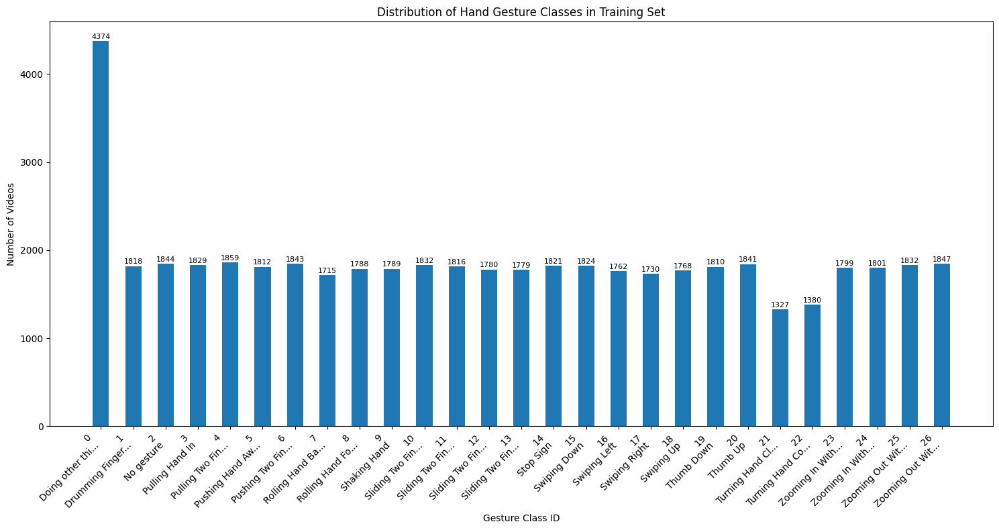

In [52]:
# Distribution of hand gesture classes in training set
plt.figure(figsize=(15, 8))
class_counts = train_df['label_id'].value_counts().sort_index()
bars = plt.bar(range(N_CLASSES), height=class_counts.values.astype(float), width=0.5)
plt.xlabel('Gesture Class ID')
plt.ylabel('Number of Videos')
plt.title('Distribution of Hand Gesture Classes in Training Set')
plt.xticks(range(N_CLASSES), [f"{i}\n{id_to_label[i][:15]}..." if len(id_to_label[i]) > 15 else f"{i}\n{id_to_label[i]}" for i in range(N_CLASSES)], rotation=45, ha='right')

# Add value labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 10,
             f'{int(height)}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


In [8]:
import pandas as pd

# Step 1: Find top 5 most common labels in the training set (due to resource constraint)
# 10: Sliding Two Fingers Down
# 11: Sliding Two Fingers Left
# 12: Sliding Two Fingers Right
# 13: Sliding Two Fingers Up
# 14: Stop Sign
# 0: Doing other things
# 24: Zooming In With Two Fingers
# 26: Zooming Out With Two Fingers
top5_labels = [0, 10, 11, 12, 13, 14]


# Step 2: Filter each DataFrame to include only those top 5 labels
train_top5_df = train_df[train_df['label_id'].isin(top5_labels)].reset_index(drop=True)
val_top5_df = val_df[val_df['label_id'].isin(top5_labels)].reset_index(drop=True)
test_top5_df = test_df[test_df['label_id'].isin(top5_labels)].reset_index(drop=True)


In [9]:
# Print summary
print("Top 5 labels:", top5_labels)
print("Train shape:", train_top5_df.shape)
print("Validation shape:", val_top5_df.shape)
print("Test shape:", test_top5_df.shape)

Top 5 labels: [0, 10, 11, 12, 13, 14]
Train shape: (13402, 6)
Validation shape: (1953, 6)
Test shape: (0, 6)


In [10]:
# Optional: Save the filtered data to new CSVs
train_top5_df.to_csv("Train_top5.csv", index=False)
val_top5_df.to_csv("Validation_top5.csv", index=False)
test_top5_df.to_csv("Test_top5.csv", index=False)



## 3. Propose Architecture for dynamic hand gesture recognition

1. Use Google's Mediapipe framework to capture hand gesture landmarks(21 x 3)

2. Then convert all frames to landmark 63x1 vector offline

3. Feed the converted numpy array 1D landmark feature vector to LSTM model to capture sequencial context feature from the video frames

4. Classify to 27 class labels

In [11]:
# Helper to draw hand landmarks on image
# Define the drawing function for hand landmarks visualization

# Drawing parameters
MARGIN = 5  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
HANDEDNESS_TEXT_COLOR = (88, 205, 54)  # vibrant green

def draw_landmarks_on_image(rgb_image, detection_result):
    """
    Draw hand landmarks on the input image.
    
    Args:
        rgb_image: Input RGB image
        detection_result: MediaPipe hand detection result
    
    Returns:
        Annotated image with hand landmarks drawn
    """
    hand_landmarks_list = detection_result.hand_landmarks
    handedness_list = detection_result.handedness
    annotated_image = np.copy(rgb_image)

    # Loop through the detected hands to visualize.
    for idx in range(len(hand_landmarks_list)):
        hand_landmarks = hand_landmarks_list[idx]
        handedness = handedness_list[idx]

        # Draw the hand landmarks.
        hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
        hand_landmarks_proto.landmark.extend([
            landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) 
            for landmark in hand_landmarks
        ])
        
        mp.solutions.drawing_utils.draw_landmarks(
            annotated_image,
            hand_landmarks_proto,
            mp.solutions.hands.HAND_CONNECTIONS,
            mp.solutions.drawing_styles.get_default_hand_landmarks_style(),
            mp.solutions.drawing_styles.get_default_hand_connections_style())

        # Get the top left corner of the detected hand's bounding box.
        height, width, _ = annotated_image.shape
        x_coordinates = [landmark.x for landmark in hand_landmarks]
        y_coordinates = [landmark.y for landmark in hand_landmarks]
        text_x = int(min(x_coordinates) * width)
        text_y = int(min(y_coordinates) * height) - MARGIN

        # Draw handedness (left or right hand) on the image.
        cv2.putText(annotated_image, f"{handedness[0].category_name}",
                    (text_x, text_y), cv2.FONT_HERSHEY_DUPLEX,
                    FONT_SIZE, HANDEDNESS_TEXT_COLOR, FONT_THICKNESS, cv2.LINE_AA)

    return annotated_image

print("✓ Hand landmarks drawing function defined successfully!")

✓ Hand landmarks drawing function defined successfully!


In [12]:
hand_landmarker_path = Path("models") / "hand_landmarker.task"
hand_landmarker_path = hand_landmarker_path.resolve()  # Get absolute path

BaseOptions = mp.tasks.BaseOptions
HandLandmarker = mp.tasks.vision.HandLandmarker
HandLandmarkerOptions = mp.tasks.vision.HandLandmarkerOptions
HandLandmarkerResult = mp.tasks.vision.HandLandmarkerResult
VisionRunningMode = mp.tasks.vision.RunningMode

# The model asset file contents as bytes.
with open(hand_landmarker_path, "rb") as f:
    hand_landmarker_buffer = f.read()

    options = HandLandmarkerOptions(
        base_options=BaseOptions(model_asset_buffer=hand_landmarker_buffer),
        running_mode=VisionRunningMode.IMAGE)
    

# Drawing helpers
mp_hands = mp.solutions.hands
hands = mp_hands.Hands()
mp_draw = mp.solutions.drawing_utils

In [13]:
# Visualize the mediapip hand landmark detection on sample video frames

# use cv2 to read the image
sample_image_path_dir = os.path.join(dataset_path, "Train", "14")

# get one of the jpg file in the directory jpegs  STOP SIGN
frame_path = [os.path.join(sample_image_path_dir, f) for f in os.listdir(sample_image_path_dir) if f.endswith('.jpg')][17]

sample_image = cv2.imread(frame_path, cv2.IMREAD_COLOR)
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# # STEP 3: Load the input image.
mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=sample_image)

# Create an HandLandmarker object.
detector = HandLandmarker.create_from_options(options)

# STEP 4: Detect hand landmarks from the input image.
detection_result = detector.detect(mp_image)
annotated_image = draw_landmarks_on_image(sample_image, detection_result)
print(detection_result.hand_landmarks[0])
cv2.imshow("annotated_image", annotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

[NormalizedLandmark(x=0.2940114736557007, y=0.9512869119644165, z=4.5270081727721845e-07, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.37481337785720825, y=0.9018081426620483, z=-0.0369596965610981, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.42866048216819763, y=0.794086217880249, z=-0.0524478480219841, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4446704089641571, y=0.6816648840904236, z=-0.06518170237541199, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4462141990661621, y=0.5883724689483643, z=-0.0802735835313797, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.3735628128051758, y=0.603488564491272, z=-0.04226875305175781, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.3795093297958374, y=0.4406753480434418, z=-0.07380329072475433, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.3820149600505829, y=0.3317975103855133, z=-0.09926891326904297, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.38167741894721985, y=0.2401084303

# 4. Convert Frames to landmark vectors

In [84]:
# ------------------------------------------------------------
# Helper: frame (BGR)  -> 63-float numpy vector
# ------------------------------------------------------------
def frame_to_landmark_vec(bgr_image, landmark_detector):
    rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
    mp_image  = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_image)
    res = landmark_detector.detect(mp_image)

    if res.hand_landmarks:                               # hand found
        lm = res.hand_landmarks[0]                       # first hand
        vec = [(p.x, p.y, p.z) for p in lm]         # 21 × (x,y,z)
        return np.array(vec, dtype=np.float64).flatten()  # shape (63,)
    else:                                           # no hand
        return np.zeros(63, dtype=np.float64)


def frame_to_landmark_vec_gpu(bgr_image, landmark_detector):
    """GPU-accelerated version of frame_to_landmark_vec"""
    # GPU-accelerated color conversion
    with cp.cuda.Device(0):  # Use first GPU
        # Move image to GPU
        gpu_bgr = cp.asarray(bgr_image)
        
        # GPU color conversion (BGR to RGB)
        gpu_rgb = cp.stack([gpu_bgr[:,:,2], gpu_bgr[:,:,1], gpu_bgr[:,:,0]], axis=2)
        
        # Move back to CPU for MediaPipe (unavoidable limitation)
        rgb_image = cp.asnumpy(gpu_rgb)
    
    # MediaPipe detection (must run on CPU)
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_image)
    res = landmark_detector.detect(mp_image)
    
    # GPU-accelerated landmark processing
    if res.hand_landmarks:
        lm = res.hand_landmarks[0]
        landmarks_list = [(p.x, p.y, p.z) for p in lm]
        
        with cp.cuda.Device(0):
            # Move landmarks to GPU for processing
            gpu_landmarks = cp.array(landmarks_list, dtype=cp.float64)
            
            # GPU operations (normalization, smoothing, etc.)
            gpu_flattened = gpu_landmarks.flatten()
            
            # Move result back to CPU
            return gpu_flattened
    else:
        # GPU-accelerated zero array creation
        with cp.cuda.Device(0):
            gpu_zeros = cp.zeros(63, dtype=cp.float64)
            return cp.asnumpy(gpu_zeros)

In [15]:
# Detect hand landmarks for each video frame and save as npy file
sample_image = cv2.imread(frame_path, cv2.IMREAD_COLOR)
# test on one sample frame converting from bgr to landmark vector
# landmark_vec = frame_to_landmark_vec(sample_image, detector)
landmark_vec = frame_to_landmark_vec_gpu(sample_image, detector)

Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU


In [16]:
# Setup GPU-based hand detector (long-lived, batched)
def build_landmarker():
    
    # The model asset file contents as bytes.
    with open(hand_landmarker_path, "rb") as f:
        hand_landmarker_buffer = f.read()

        options = HandLandmarkerOptions(
            base_options=BaseOptions(model_asset_buffer=hand_landmarker_buffer),
            running_mode=VisionRunningMode.IMAGE)
    
    return HandLandmarker.create_from_options(options)

# Flatten result to (63,)
def flatten_landmarks(landmarks):
    return np.array([[lm.x, lm.y, lm.z] for lm in landmarks]).flatten()

# Uniformly sample/pad to fixed 30x63 shape
def to_fixed_len(arr, seq_len=30):
    f = arr.shape[0]
    if f >= seq_len:
        idx = np.round(np.linspace(0, f - 1, seq_len)).astype(int)
        return arr[idx]
    else:
        pad = np.zeros((seq_len - f, arr.shape[1]), arr.dtype)
        return np.concatenate([arr, pad], axis=0)

# Process one video clip folder
# def process_clip_folder(clip_path, detector):
#     video_id = os.path.basename(clip_path)
#     out_path = os.path.join(clip_path, f"{video_id}.npy")
#     if os.path.exists(out_path):
#         print(f"Skipping {out_path} because it already exists")
#         return  # Skip if already processed

#     frames = sorted([f for f in os.listdir(clip_path) if f.endswith(".jpg")])
#     print(f"Found {len(frames)} frames")
#     if not frames: return

#     vectors = []
#     for i, fname in enumerate(frames):
#         img_path = os.path.join(clip_path, fname)
#         bgr_image = cv2.imread(img_path)
#         if bgr_image is None: continue
#         landmark_vector = frame_to_landmark_vec_gpu(bgr_image, detector)
#         # res = detector.detect_for_video(mp_img, i * 33)
#         # if res.hand_landmarks:
#         #     vec = flatten_landmarks(res.hand_landmarks[0])
#         # else:
#         #     vec = np.zeros((63,), dtype=np.float32)
#         vectors.append(landmark_vector)

#     if not vectors:
#         return
#     print(f"Stacking {len(vectors)} vectors")
#     stacked = np.stack(vectors, axis=0)
#     final = to_fixed_len(stacked, 30)
#     print(final.shape)
#     np.save(out_path, final)

# Process one video clip folder
def process_clip_folder(clip_path, detector):
    video_id = os.path.basename(clip_path)
    out_path = os.path.join(clip_path, f"{video_id}.npy")
    if os.path.exists(out_path):
        print(f"Skipping {out_path} because it already exists")
        return  # Skip if already processed

    frames = sorted([f for f in os.listdir(clip_path) if f.endswith(".jpg")])
    print(f"Found {len(frames)} frames")
    if not frames: return

    vectors = []
    for i, fname in enumerate(frames):
        img_path = os.path.join(clip_path, fname)
        bgr_image = cv2.imread(img_path)
        if bgr_image is None: continue
        
        landmark_vector = frame_to_landmark_vec_gpu(bgr_image, detector)
        
        # ENSURE NUMPY ARRAY - Convert any CuPy arrays to NumPy
        if hasattr(landmark_vector, 'get'):  # CuPy array has .get() method
            landmark_vector = landmark_vector.get()  # Convert CuPy to NumPy
        elif str(type(landmark_vector)).find('cupy') != -1:  # Alternative check
            import cupy as cp
            landmark_vector = cp.asnumpy(landmark_vector)
            
        vectors.append(landmark_vector)

    if not vectors:
        return
        
    print(f"Stacking {len(vectors)} vectors")
    stacked = np.stack(vectors, axis=0)
    final = to_fixed_len(stacked, 30)
    print(final.shape)
    np.save(out_path, final)

In [19]:
import os
from concurrent.futures import ThreadPoolExecutor, as_completed

def process_clip_batch(batch_paths):
    detector = build_landmarker()
    for path in batch_paths:
        process_clip_folder(path, detector)

def process_dataset_batched(df, dataset_split_dir, batch_size=50):
    video_ids = df["video_id"].unique().tolist()
    clip_paths = [os.path.join(dataset_split_dir, str(vid)) for vid in video_ids]

    print(f"Found {len(clip_paths)} clips")
    batches = [clip_paths[i:i+batch_size] for i in range(0, len(clip_paths), batch_size)]
    print(f"🔁 Processing {len(clip_paths)} clips in {len(batches)} batches")

    with ThreadPoolExecutor(max_workers=4) as executor:  # Start with 4 workers
        futures = [executor.submit(process_clip_batch, batch) for batch in batches]
        
        completed = 0
        for future in as_completed(futures):
            try:
                future.result()
                completed += 1
                progress = (completed/len(batches)*100)
                print(f"Completed batch {completed}/{len(batches)} ({progress:.1f}%)")
            except Exception as e:
                print(f"❌ Batch failed with error: {e}")
                
    print("✅ Done.")



Found 13402 clips
🔁 Processing 13402 clips in 269 batches
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\1051\1051.npy because it already exists
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\1\1.npy because it already exists
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\1053\1053.npy because it already exists
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\11\11.npy because it already exists
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\1056\1056.npy because it already exists
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\622\622.npy because it already exists
Skipping e:\DynamicHandRecognition\data\datasets\toxicmender\20bn-jester\versions\3\Train\1611\1611.npy because it already exists
Skipping e:\DynamicHandRecognition\data\data

In [44]:
# Run it
# process_dataset_batched(train_top5_df, os.path.join(dataset_path, "Train"))
process_dataset_batched(val_top5_df, os.path.join(dataset_path, "Validation"))

Found 1953 clips
🔁 Processing 1953 clips in 40 batches
Found 37 frames
Found 37 frames
Found 37 frames
Found 37 frames
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Using device 0: N

In [45]:
train_top5_df.head()

,video_id,label,frames,label_id,shape,format
0,1,Doing other things,37,0,"(100, 176)",JPEG
1,11,Sliding Two Fingers Down,37,10,"(100, 176)",JPEG
2,20,Doing other things,37,0,"(100, 176)",JPEG
3,31,Stop Sign,37,14,"(100, 176)",JPEG
4,36,Sliding Two Fingers Up,37,13,"(100, 176)",JPEG


# 5. Model Training

In [46]:
import pandas as pd
import tensorflow as tf
import numpy as np
import os

SEQ_LEN = 30
N_FEAT = 63
NUM_CLASSES = 6  # adjust based on your label map

# Load metadata
train_df = pd.read_csv("Train_top5.csv")
val_df   = pd.read_csv("Validation_top5.csv")

# Add full path to .npy
train_df["npy_path"] = train_df["video_id"].apply(lambda x: os.path.join(dataset_path, "Train", str(x), f"{x}.npy"))
val_df["npy_path"]   = val_df["video_id"].apply(lambda x: os.path.join(dataset_path, "Validation", str(x), f"{x}.npy"))


# Step 1: Create label mapping
unique_labels = sorted(train_df['label_id'].unique())
print(f"Original labels: {unique_labels}")

# Create mapping: 0→0, 10→1, 11→2, 12→3, 13→4, 14→5
label_mapping = {old_label: new_label for new_label, old_label in enumerate(unique_labels)}
reverse_mapping = {v: k for k, v in label_mapping.items()}

print("Label mapping:")
for old, new in label_mapping.items():
    print(f"  {old} → {new}")


train_df['label_id'] = train_df['label_id'].map(label_mapping)
val_df['label_id'] = val_df['label_id'].map(label_mapping)



Original labels: [0, 10, 11, 12, 13, 14]
Label mapping:
  0 → 0
  10 → 1
  11 → 2
  12 → 3
  13 → 4
  14 → 5


In [47]:
train_df.head()

,video_id,label,frames,label_id,shape,format,npy_path
0,1,Doing other things,37,0,"(100, 176)",JPEG,e:\DynamicHandRecognition\data\datasets\toxicm...
1,11,Sliding Two Fingers Down,37,1,"(100, 176)",JPEG,e:\DynamicHandRecognition\data\datasets\toxicm...
2,20,Doing other things,37,0,"(100, 176)",JPEG,e:\DynamicHandRecognition\data\datasets\toxicm...
3,31,Stop Sign,37,5,"(100, 176)",JPEG,e:\DynamicHandRecognition\data\datasets\toxicm...
4,36,Sliding Two Fingers Up,37,4,"(100, 176)",JPEG,e:\DynamicHandRecognition\data\datasets\toxicm...


In [48]:
def load_clip(path, label):
    def _load(npy_path):
        arr = np.load(npy_path.decode())
        return arr.astype(np.float32)
    
    clip = tf.numpy_function(_load, [path], tf.float32)
    clip.set_shape((SEQ_LEN, N_FEAT))
    return clip, tf.cast(label, tf.int32)

def make_dataset(df, batch_size=64, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices((df["npy_path"].values, df["label_id"].values))
    
    if shuffle:
        # Use reasonable buffer size to avoid memory issues
        buffer_size = min(10000, len(df))
        ds = ds.shuffle(buffer_size=buffer_size)
    
    # Load data in parallel
    ds = ds.map(load_clip, num_parallel_calls=tf.data.AUTOTUNE)
    
    # Batch and prefetch for efficiency
    ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.AUTOTUNE)
    
    return ds

In [49]:
# Create datasets
train_ds = make_dataset(train_df, batch_size=32)  # Start smaller
val_ds = make_dataset(val_df, batch_size=32)

In [109]:
from tensorflow.keras import Sequential, Input
from tensorflow.keras.layers import Masking, LSTM, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization, GRU


# Fixed model definition
model = Sequential([
    Input(shape=(SEQ_LEN, N_FEAT)),           # ✅ Input layer first
    Masking(mask_value=0),                    # ✅ No input_shape needed
    LSTM(128, return_sequences=True),
    Dropout(0.2),
    LSTM(64),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])




In [110]:
model.compile(
    optimizer='adam',
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

# Verify the model
model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ masking_11 (Masking)            │ (None, 30, 63)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_22 (LSTM)                  │ (None, 30, 64)         │        32,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_23 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 6)              │           198 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,438 (181.40 KB)

 Trainable params: 46,438 (181.40 KB)

 Non-trainable params: 0 (0.00 B)

In [111]:
model.fit(train_ds,
          validation_data=val_ds,
          epochs=20,
          callbacks=[
              tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)
          ])


Epoch 1/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 25s 51ms/step - accuracy: 0.5172 - loss: 1.3375 - val_accuracy: 0.7609 - val_loss: 0.7128
Epoch 2/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - accuracy: 0.7647 - loss: 0.7163 - val_accuracy: 0.7788 - val_loss: 0.6325
Epoch 3/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - accuracy: 0.7831 - loss: 0.6393 - val_accuracy: 0.7757 - val_loss: 0.6471
Epoch 4/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - accuracy: 0.7952 - loss: 0.5972 - val_accuracy: 0.7921 - val_loss: 0.5867
Epoch 5/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - accuracy: 0.7977 - loss: 0.5765 - val_accuracy: 0.7988 - val_loss: 0.5778
Epoch 6/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - accuracy: 0.8067 - loss: 0.5610 - val_accuracy: 0.7993 - val_loss: 0.5823
Epoch 7/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.8104 - loss: 0.5472 - val_accuracy: 0.8034 - val_loss: 0.5619
Epoch 8/20
419/419 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - accuracy: 0.8212 - loss: 0.5245 - 

In [53]:
model.save("gesture_lstm_model1.keras")


In [62]:
import cv2
import numpy as np
import tensorflow as tf

def test_single_image(image_path, model, reverse_mapping, detector=None):
    """
    Test function that takes a single image and predicts the gesture class
    
    Args:
        image_path: Path to the test image
        model: Trained model
        reverse_mapping: Dict to map predicted class back to original labels
        detector: Hand landmark detector (will create if None)
    
    Returns:
        prediction: Original label prediction
        confidence: Prediction confidence
        landmark_vector: The extracted landmark vector
    """
    
    # Step 1: Create detector if not provided
    if detector is None:
        detector = build_landmarker()
    
    # Step 2: Load and process the image
    try:
        bgr_image = cv2.imread(image_path)
        if bgr_image is None:
            raise ValueError(f"Could not load image from {image_path}")
        
        print(f"Loaded image: {bgr_image.shape}")
        
        # Extract landmark vector using your existing function
        landmark_vector = frame_to_landmark_vec_gpu(bgr_image, detector)
        
        # Ensure it's a numpy array
        if hasattr(landmark_vector, 'get'):  # CuPy array
            landmark_vector = landmark_vector.get()
        landmark_vector = np.array(landmark_vector, dtype=np.float32)
        
        print(f"Extracted landmark vector shape: {landmark_vector.shape}")
        
    except Exception as e:
        print(f"❌ Error processing image: {e}")
        return None, None, None
    
    # Step 3: Create 30x63 sequence (pad with zeros)
    SEQ_LEN = 30
    N_FEAT = 63
    
    # Create sequence of 30 frames, all the same (or pad with zeros)
    sequence = np.zeros((SEQ_LEN, N_FEAT), dtype=np.float32)
    
    # Option A: Repeat the same frame 30 times
    for i in range(SEQ_LEN):
        sequence[i] = landmark_vector
    
    # Option B: Only put the frame in the first position, rest zeros
    # sequence[0] = landmark_vector  # Uncomment this and comment above if you prefer
    
    print(f"Created sequence shape: {sequence.shape}")
    
    # Step 4: Add batch dimension and make prediction
    input_tensor = tf.expand_dims(sequence, axis=0)  # Shape: (1, 30, 63)
    print(f"Input tensor shape: {input_tensor.shape}")
    
    # Make prediction
    predictions = model.predict(input_tensor, verbose=0)
    predicted_class = np.argmax(predictions[0])
    confidence = predictions[0][predicted_class]
    
    # Map back to original label
    original_label = reverse_mapping[predicted_class]
    
    print(f"🎯 Prediction Results:")
    print(f"   Predicted class (mapped): {predicted_class}")
    print(f"   Original label: {original_label}")
    print(f"   Confidence: {confidence:.3f}")
    print(f"   All probabilities: {predictions[0]}")
    
    return original_label, confidence, landmark_vector

# Test function with visualization
def test_single_image_with_viz(image_path, model, reverse_mapping, label_names=None):
    """
    Enhanced test function with visualization
    """
    detector = build_landmarker()
    
    # Get prediction
    prediction, confidence, landmarks = test_single_image(
        image_path, model, reverse_mapping, detector
    )
    
    if prediction is None:
        return
    
    # Load image for visualization
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Display results
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(12, 4))
    
    # Show original image
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title(f'Input Image\n{image_path}')
    plt.axis('off')
    
    # Show prediction results
    plt.subplot(1, 2, 2)
    predictions_full = model.predict(tf.expand_dims(np.zeros((30, 63)), 0), verbose=0)[0]
    
    if label_names is None:
        label_names = [f'Class {reverse_mapping[i]}' for i in range(len(predictions_full))]
    
    bars = plt.bar(range(len(predictions_full)), predictions_full)
    bars[np.argmax(predictions_full)].set_color('red')
    
    plt.title(f'Prediction: {prediction}\nConfidence: {confidence:.3f}')
    plt.xlabel('Classes')
    plt.ylabel('Probability')
    plt.xticks(range(len(label_names)), label_names, rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    return prediction, confidence

# Usage example
def run_image_test():
    """
    Example of how to use the test function
    """
    
    # Assuming you have these from your training
    # model = your_trained_model
    # reverse_mapping = {0: 0, 1: 10, 2: 11, 3: 12, 4: 13, 5: 14}
    
    # Define your gesture class names (optional)
    gesture_names = {
        0: "Gesture_0",
        10: "Sliding Two Fingers Left", 
        11: "Sliding Two Fingers Right",
        12: "Sliding Two Fingers Down",
        13: "Sliding Two Fingers Up", 
        14: "Stop Sign"
    }
    
    # Test image path
    image_path = "sample_image.jpg"
    
    print("🧪 Testing single image prediction...")
    
    # Simple test
    prediction, confidence, landmarks = test_single_image(
        image_path, model, reverse_mapping
    )
    
    if prediction is not None:
        gesture_name = gesture_names.get(prediction, f"Unknown_{prediction}")
        print(f"\n✅ Final Result: {gesture_name} (confidence: {confidence:.3f})")
        
        # Test with visualization (optional)
        # test_single_image_with_viz(image_path, model, reverse_mapping, 
        #                           [gesture_names.get(reverse_mapping[i], f"Class_{i}") 
        #                            for i in range(6)])

# Quick test function for multiple images
def test_multiple_images(image_paths, model, reverse_mapping):
    """
    Test multiple images quickly
    """
    detector = build_landmarker()  # Create once, use for all
    gesture_names = {
        0: "Doing Other Things",
        10: "Sliding Two Fingers Left", 
        11: "Sliding Two Fingers Right",
        12: "Sliding Two Fingers Down",
        13: "Sliding Two Fingers Up", 
        14: "Stop Sign"
    }

    results = []
    for img_path in image_paths:
        print(f"\n--- Testing: {img_path} ---")
        pred, conf, _ = test_single_image(img_path, model, reverse_mapping, detector)
        gesture_name = gesture_names.get(pred, f"Unknown_{pred}")
        results.append((img_path, pred, gesture_name, conf))
    
    print("\n📊 Summary Results:")
    print("-" * 50)
    for img_path, pred, gesture_name, conf in results:
        if pred is not None:
            print(f"{img_path}: {gesture_name} (confidence: {conf:.3f})")
        else:
            print(f"{img_path}: ❌ Failed to process")
    
    return results

    


In [63]:
# Multiple images test
test_images = ["stop.jpg", "swipe_left.jpg"]
test_multiple_images(test_images, model, reverse_mapping)


--- Testing: stop.jpg ---
Loaded image: (720, 1280, 3)
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Extracted landmark vector shape: (63,)
Created sequence shape: (30, 63)
Input tensor shape: (1, 30, 63)
🎯 Prediction Results:
   Predicted class (mapped): 5
   Original label: 14
   Confidence: 0.997
   All probabilities: [2.7878452e-03 1.6393811e-06 2.1106134e-06 3.4863902e-08 3.4797384e-05
 9.9717355e-01]

--- Testing: swipe_left.jpg ---
Loaded image: (720, 1280, 3)
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Extracted landmark vector shape: (63,)
Created sequence shape: (30, 63)
Input tensor shape: (1, 30, 63)
🎯 Prediction Results:
   Predicted class (mapped): 0
   Original label: 0
   Confidence: 0.875
   All probabilities: [0.8750234  0.00716535 0.00981098 0.05045314 0.05542867 0.00211851]

📊 Summary Results:
--------------------------------------------------
stop.jpg: Stop Sign (confidence: 0.997)
swipe_left.jpg: Doing Other Things (confidence: 0.875)


[('stop.jpg', 14, 'Stop Sign', 0.99717355),
 ('swipe_left.jpg', 0, 'Doing Other Things', 0.8750234)]

In [56]:
# Single image test
run_image_test()

🧪 Testing single image prediction...
Loaded image: (100, 176, 3)
Using device 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
Extracted landmark vector shape: (63,)
Created sequence shape: (30, 63)
Input tensor shape: (1, 30, 63)
🎯 Prediction Results:
   Predicted class (mapped): 5
   Original label: 14
   Confidence: 0.999
   All probabilities: [1.3444632e-03 7.6869270e-07 1.0544084e-06 1.3255713e-08 2.3639106e-05
 9.9863017e-01]

✅ Final Result: Stop Sign (confidence: 0.999)


# 6. Model Evaluation and Testing

import cv2, collections, numpy as np, mediapipe as mp, tensorflow as tf, json

# ---- load model + label map -------------
model = tf.keras.models.load_model("best_lstm.keras")
id2label = {v:k for k,v in label2id.items()}

# ---- MediaPipe initialisation -----------
mp_hands = mp.solutions.hands.Hands(
        static_image_mode=False,
        max_num_hands=1,
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5)

def frame_to_vec(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    res = mp_hands.process(rgb)
    if res.multi_hand_landmarks:
        lm = res.multi_hand_landmarks[0].landmark
        return np.array([(p.x, p.y, p.z) for p in lm], dtype=np.float32).flatten()
    else:
        return np.zeros(63, dtype=np.float32)

# ---- sliding window buffer --------------
buffer = collections.deque(maxlen=SEQ_LEN)
last_preds = collections.deque(maxlen=4)     # for debounce

cap = cv2.VideoCapture(0)
print("ESC to quit …")
while True:
    ok, frame = cap.read()
    if not ok: break

    vec63 = frame_to_vec(frame)
    buffer.append(vec63)

    if len(buffer) == SEQ_LEN:
        seq = np.expand_dims(np.array(buffer), axis=0)     # (1,T,63)
        logits = model(seq, training=False)
        pred   = int(tf.argmax(logits, axis=1)[0])
        last_preds.append(pred)

        # majority vote of last few outputs to stabilise
        if len(last_preds) == last_preds.maxlen and len(set(last_preds)) == 1:
            gesture = id2label[pred]
            cv2.putText(frame, gesture, (10,50),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0,255,0), 2)
            # TODO: map gesture → key / UI event here

    cv2.imshow("Live Gestures", frame)
    if cv2.waitKey(1) & 0xFF == 27:   # ESC
        break

cap.release()
cv2.destroyAllWindows()


In [71]:
import numpy as np
from collections import deque
from tensorflow.keras.models import load_model

# Load trained model (saved via model.save())
model = load_model("gesture_lstm_model.keras")

# Sliding buffer to store the last 30 landmark vectors (each is 63-D)
SEQ_LEN = 30
buffer = deque(maxlen=SEQ_LEN)

# Optional: track last few predictions for stability
pred_history = deque(maxlen=4)

# Dummy label map (replace with yours)
label_map = {0: "Doing Other Things", 10: "Sliding Two Fingers Down", 11: "Sliding Two Fingers Left", 12: "Sliding Two Fingers Right", 13: "Sliding Two Fingers Up", 14: "Stop Sign"}


def infer_gesture(new_landmark_vec):
    """
    Push a new frame's landmark vector and run inference if buffer is full.
    Returns: gesture label (or None if not stable yet)
    """
    buffer.append(new_landmark_vec)

    if len(buffer) < SEQ_LEN:
        return None  # wait until full

    # Convert to (1, 30, 63) for LSTM
    input_seq = np.array(buffer)[None, :, :]

    # Run prediction
    probs = model.predict(input_seq, verbose=0)[0]  # shape (num_classes,)
    pred_class = np.argmax(probs)
    confidence = probs[pred_class]

    pred_history.append(pred_class)

    # Optional: require 3 out of 4 recent predictions to match
    if pred_history.count(pred_class) >= 3 and confidence > 0.8:
        return label_map[label_mapping[pred_class]]

    return None


In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

history = model.fit(train_ds,
          validation_data=val_ds,
          epochs=20,
          callbacks=[
              tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)
          ])


In [116]:
import cv2
import numpy as np
import tensorflow as tf
from collections import deque
import time

def live_gesture_recognition(model, reverse_mapping, gesture_names=None, 
                           confidence_threshold=0.7, seq_len=30, n_feat=63):
    """
    Live camera gesture recognition with real-time inference
    
    Args:
        model: Trained gesture recognition model
        reverse_mapping: Dict to map predicted classes back to original labels
        gesture_names: Dict mapping original labels to gesture names
        confidence_threshold: Minimum confidence to show prediction
        seq_len: Sequence length expected by model (30)
        n_feat: Feature dimension expected by model (63)
    """
    
    # Initialize camera
    cap = cv2.VideoCapture(0)
    if not cap.isOpened():
        print("❌ Error: Could not open camera")
        return
    
    # Set camera properties for better performance
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
    cap.set(cv2.CAP_PROP_FPS, 30)
    
    # Initialize hand detector
    print("🤖 Initializing hand detector...")
    detector = build_landmarker()
    
    # Initialize frame buffer for sequence
    frame_buffer = deque(maxlen=seq_len)
    
    # Initialize with zeros
    for _ in range(seq_len):
        frame_buffer.append(np.zeros(n_feat, dtype=np.float32))
    
    # Performance tracking
    fps_counter = 0
    fps_start_time = time.time()
    fps_display = 0
    
    # Current prediction state
    current_prediction = "No Gesture"
    current_confidence = 0.0
    prediction_color = (255, 255, 255)  # White for no prediction
    
    print("🎥 Starting live gesture recognition...")
    print("Press 'q' to quit, 'r' to reset buffer, 's' to screenshot")
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                print("❌ Error: Could not read frame")
                break
            
            # Flip frame horizontally for mirror effect
            frame = cv2.flip(frame, 1)
            
            # Process frame for hand landmarks
            try:
                # Extract landmarks
                landmark_vector = frame_to_landmark_vec_gpu(frame, detector)
                
                # Convert to numpy if needed
                if hasattr(landmark_vector, 'get'):
                    landmark_vector = landmark_vector.get()
                landmark_vector = np.array(landmark_vector, dtype=np.float32)
                
                # Add to buffer
                frame_buffer.append(landmark_vector)
                
                # Create sequence for prediction
                sequence = np.array(list(frame_buffer))
                input_tensor = tf.expand_dims(sequence, axis=0)
                
                # Make prediction
                predictions = model.predict(input_tensor, verbose=0)
                predicted_class = np.argmax(predictions[0])
                confidence = predictions[0][predicted_class]
                
                # Update prediction if confidence is high enough
                if confidence >= confidence_threshold:
                    original_label = reverse_mapping[predicted_class]
                    if gesture_names and original_label in gesture_names:
                        current_prediction = gesture_names[original_label]
                    else:
                        current_prediction = f"Gesture {original_label}"
                    current_confidence = confidence
                    prediction_color = (0, 255, 0)  # Green for confident prediction
                else:
                    current_prediction = "Low Confidence"
                    current_confidence = confidence
                    prediction_color = (0, 255, 255)  # Yellow for low confidence
                    
            except Exception as e:
                # If hand detection fails, add zeros to buffer
                frame_buffer.append(np.zeros(n_feat, dtype=np.float32))
                current_prediction = "No Hand Detected"
                current_confidence = 0.0
                prediction_color = (0, 0, 255)  # Red for no detection
            
            # Calculate FPS
            fps_counter += 1
            if time.time() - fps_start_time >= 1.0:
                fps_display = fps_counter
                fps_counter = 0
                fps_start_time = time.time()
            
            # Draw overlay information
            draw_overlay(frame, current_prediction, current_confidence, 
                        fps_display, prediction_color, len(frame_buffer))
            
            # Display frame
            cv2.imshow('Live Gesture Recognition', frame)
            
            # Handle key presses
            key = cv2.waitKey(1) & 0xFF
            if key == ord('q'):
                break
            elif key == ord('r'):
                # Reset buffer
                frame_buffer.clear()
                for _ in range(seq_len):
                    frame_buffer.append(np.zeros(n_feat, dtype=np.float32))
                print("🔄 Buffer reset")
            elif key == ord('s'):
                # Save screenshot
                timestamp = int(time.time())
                filename = f"gesture_screenshot_{timestamp}.jpg"
                cv2.imwrite(filename, frame)
                print(f"📸 Screenshot saved: {filename}")
    
    except KeyboardInterrupt:
        print("\n⏹️ Stopping...")
    
    finally:
        # Cleanup
        cap.release()
        cv2.destroyAllWindows()
        print("✅ Camera released and windows closed")

def draw_overlay(frame, prediction, confidence, fps, color, buffer_size):
    """
    Draw prediction overlay on frame
    """
    height, width = frame.shape[:2]
    
    # Semi-transparent overlay background
    overlay = frame.copy()
    cv2.rectangle(overlay, (10, 10), (width-10, 150), (0, 0, 0), -1)
    cv2.addWeighted(overlay, 0.7, frame, 0.3, 0, frame)
    
    # Main prediction text
    cv2.putText(frame, f"Gesture: {prediction}", (20, 40), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    
    # Confidence
    cv2.putText(frame, f"Confidence: {confidence:.3f}", (20, 70), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
    
    # FPS
    cv2.putText(frame, f"FPS: {fps}", (20, 100), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
    
    # Buffer status
    cv2.putText(frame, f"Buffer: {buffer_size}/30", (20, 130), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
    
    # Instructions
    cv2.putText(frame, "Press 'q' to quit | 'r' to reset | 's' for screenshot", 
                (10, height-20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
    
    # Confidence bar
    bar_width = int((width - 40) * confidence)
    cv2.rectangle(frame, (20, height-50), (20 + bar_width, height-35), color, -1)
    cv2.rectangle(frame, (20, height-50), (width-20, height-35), (255, 255, 255), 2)

def live_gesture_recognition_advanced(model, reverse_mapping, gesture_names=None):
    """
    Advanced version with additional features
    """
    
    # Initialize
    cap = cv2.VideoCapture(0)
    detector = build_landmarker()
    
    # Advanced buffer management
    frame_buffer = deque(maxlen=30)
    prediction_history = deque(maxlen=10)  # Smooth predictions
    
    # Recording option
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = None
    recording = False
    
    # Statistics
    gesture_counts = {}
    session_start = time.time()
    
    print("🎥 Advanced Live Gesture Recognition")
    print("Controls:")
    print("  'q' - Quit")
    print("  'r' - Reset buffer")
    print("  's' - Screenshot")
    print("  'v' - Start/Stop recording")
    print("  'c' - Clear statistics")
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
                
            frame = cv2.flip(frame, 1)
            
            # Process frame
            try:
                landmark_vector = frame_to_landmark_vec_gpu(frame, detector)
                if hasattr(landmark_vector, 'get'):
                    landmark_vector = landmark_vector.get()
                landmark_vector = np.array(landmark_vector, dtype=np.float32)
                
                frame_buffer.append(landmark_vector)
                
                if len(frame_buffer) == 30:
                    sequence = np.array(list(frame_buffer))
                    predictions = model.predict(tf.expand_dims(sequence, 0), verbose=0)
                    predicted_class = np.argmax(predictions[0])
                    confidence = predictions[0][predicted_class]
                    
                    # Add to prediction history for smoothing
                    prediction_history.append((predicted_class, confidence))
                    
                    # Get smoothed prediction (most common in recent history)
                    recent_predictions = [p[0] for p in prediction_history if p[1] > 0.6]
                    if recent_predictions:
                        smoothed_prediction = max(set(recent_predictions), 
                                                key=recent_predictions.count)
                        avg_confidence = np.mean([p[1] for p in prediction_history 
                                                if p[0] == smoothed_prediction])
                        
                        original_label = reverse_mapping[smoothed_prediction]
                        gesture_name = gesture_names.get(original_label, f"Gesture {original_label}")
                        
                        # Update statistics
                        gesture_counts[gesture_name] = gesture_counts.get(gesture_name, 0) + 1
                        
                        # Draw advanced overlay
                        draw_advanced_overlay(frame, gesture_name, avg_confidence, 
                                            gesture_counts, session_start, recording)
                    else:
                        draw_advanced_overlay(frame, "Low Confidence", 0.0, 
                                            gesture_counts, session_start, recording)
                else:
                    draw_advanced_overlay(frame, "Warming up...", 0.0, 
                                        gesture_counts, session_start, recording)
                    
            except Exception as e:
                frame_buffer.append(np.zeros(63, dtype=np.float32))
                draw_advanced_overlay(frame, "No Hand", 0.0, 
                                    gesture_counts, session_start, recording)
            
            # Record if enabled
            if recording and out is not None:
                out.write(frame)
            
            cv2.imshow('Advanced Gesture Recognition', frame)
            
            # Handle keys
            key = cv2.waitKey(1) & 0xFF
            if key == ord('q'):
                break
            elif key == ord('r'):
                frame_buffer.clear()
                prediction_history.clear()
            elif key == ord('s'):
                timestamp = int(time.time())
                cv2.imwrite(f"gesture_{timestamp}.jpg", frame)
            elif key == ord('v'):
                if not recording:
                    timestamp = int(time.time())
                    out = cv2.VideoWriter(f'gesture_recording_{timestamp}.avi', 
                                        fourcc, 20.0, (640, 480))
                    recording = True
                    print("🔴 Recording started")
                else:
                    recording = False
                    if out:
                        out.release()
                    print("⏹️ Recording stopped")
            elif key == ord('c'):
                gesture_counts.clear()
                session_start = time.time()
                print("📊 Statistics cleared")
    
    finally:
        cap.release()
        if out:
            out.release()
        cv2.destroyAllWindows()

def draw_advanced_overlay(frame, prediction, confidence, stats, session_start, recording):
    """
    Draw advanced overlay with statistics
    """
    height, width = frame.shape[:2]
    
    # Main overlay
    overlay = frame.copy()
    cv2.rectangle(overlay, (10, 10), (width-10, 200), (0, 0, 0), -1)
    cv2.addWeighted(overlay, 0.8, frame, 0.2, 0, frame)
    
    # Current prediction
    color = (0, 255, 0) if confidence > 0.7 else (0, 255, 255) if confidence > 0.3 else (0, 0, 255)
    cv2.putText(frame, f"Gesture: {prediction}", (20, 40), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    cv2.putText(frame, f"Confidence: {confidence:.3f}", (20, 70), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
    
    # Session statistics
    session_time = int(time.time() - session_start)
    cv2.putText(frame, f"Session: {session_time}s", (20, 100), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
    
    # Top gestures
    if stats:
        sorted_gestures = sorted(stats.items(), key=lambda x: x[1], reverse=True)[:3]
        for i, (gesture, count) in enumerate(sorted_gestures):
            cv2.putText(frame, f"{gesture}: {count}", (20, 130 + i*20), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
    
    # Recording indicator
    if recording:
        cv2.circle(frame, (width-30, 30), 10, (0, 0, 255), -1)
        cv2.putText(frame, "REC", (width-50, 45), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 255), 1)

def live_gesture_recognition_30fps(model, reverse_mapping, gesture_names=None, 
                                 confidence_threshold=0.7, seq_len=30, n_feat=63):
    """
    Optimized live gesture recognition for 30 fps
    """
    
    # Initialize camera with optimized settings
    cap = cv2.VideoCapture(0)
    
    # Set camera to 30 fps and lower resolution for speed
    cap.set(cv2.CAP_PROP_FPS, 30)
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)   # Lower resolution = faster
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
    cap.set(cv2.CAP_PROP_BUFFERSIZE, 1)      # Reduce buffer to avoid lag
    
    # Initialize detector once
    detector = build_landmarker()
    
    # Frame buffer for sequence
    frame_buffer = deque(maxlen=seq_len)
    
    # Performance tracking
    fps_counter = 0
    start_time = time.time()
    frame_time = 1.0 / 30  # Target 30 fps (33.33ms per frame)
    
    print("🎥 Starting 30 FPS gesture recognition...")
    print("Press 'q' to quit")
    
    while True:
        loop_start = time.time()
        
        ret, frame = cap.read()
        if not ret:
            break
            
        # Flip for mirror effect
        frame = cv2.flip(frame, 1)
        
        # **FAST PROCESSING PATH**
        try:
            # Extract landmarks (this is the bottleneck)
            landmark_vec = frame_to_landmark_vec_gpu(frame, detector)
            
            if landmark_vec is not None:
                frame_buffer.append(landmark_vec)
                
                # Only predict when we have enough frames
                if len(frame_buffer) == seq_len:
                    # Create sequence and predict
                    sequence = np.array(frame_buffer, dtype=np.float32)
                    sequence = np.expand_dims(sequence, axis=0)  # Add batch dim
                    
                    # **FAST INFERENCE** - use model.predict() is slow, use model() instead
                    predictions = model(sequence, training=False)  # Faster than predict()
                    predicted_class = tf.argmax(predictions[0]).numpy()
                    confidence = tf.reduce_max(predictions[0]).numpy()
                    
                    if confidence > confidence_threshold:
                        original_label = reverse_mapping[predicted_class]
                        gesture_name = gesture_names.get(original_label, f"Gesture_{original_label}") if gesture_names else f"Class_{original_label}"
                        
                        # Display prediction
                        cv2.putText(frame, f"{gesture_name}", (10, 30), 
                                   cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
                        cv2.putText(frame, f"Confidence: {confidence:.2f}", (10, 70), 
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
            
            # Draw hand landmarks on frame (optional - remove for speed)
            # frame = draw_landmarks_on_frame(frame, landmark_vec)  # Comment out for max speed
            
        except Exception as e:
            print(f"Processing error: {e}")
        
        # FPS counter
        fps_counter += 1
        current_time = time.time()
        elapsed = current_time - start_time
        current_fps = fps_counter / elapsed if elapsed > 0 else 0
        
        # Display FPS
        cv2.putText(frame, f"FPS: {current_fps:.1f}", (frame.shape[1] - 150, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)
        
        # Show frame
        cv2.imshow('Gesture Recognition - 30 FPS', frame)
        
        # **TIMING CONTROL** - maintain 30 fps
        loop_time = time.time() - loop_start
        sleep_time = max(0, frame_time - loop_time)
        if sleep_time > 0:
            time.sleep(sleep_time)
        
        # Exit on 'q'
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    
    cap.release()
    cv2.destroyAllWindows()
    
    # Final FPS report
    total_time = time.time() - start_time
    avg_fps = fps_counter / total_time
    print(f"Average FPS: {avg_fps:.2f}")

import threading
from queue import Queue

import threading
from queue import Queue
import traceback

def live_gesture_recognition_threaded(model, reverse_mapping, gesture_names=None):
    """
    Fixed threaded version - handles CuPy to NumPy conversion
    """
    
    # Shared queues
    frame_queue = Queue(maxsize=2)
    result_queue = Queue(maxsize=1)
    
    # Processing thread
    def process_frames():
        print("🔧 Processing thread started")
        
        try:
            detector = build_landmarker()
            print("✅ Detector created successfully")
        except Exception as e:
            print(f"❌ Failed to create detector: {e}")
            return
            
        frame_buffer = deque(maxlen=30)
        
        while True:
            try:
                if not frame_queue.empty():
                    frame = frame_queue.get()
                    if frame is None:  # Exit signal
                        break
                    
                    # Process frame
                    landmark_vec = frame_to_landmark_vec_gpu(frame, detector)
                    
                    if landmark_vec is not None:
                        # **KEY FIX: Convert CuPy array to NumPy array**
                        if hasattr(landmark_vec, 'get'):  # It's a CuPy array
                            landmark_vec = landmark_vec.get()  # Transfer from GPU to CPU
                        
                        frame_buffer.append(landmark_vec)
                        
                        if len(frame_buffer) == 30:
                            # Now this will work because all arrays are NumPy
                            sequence = np.array(frame_buffer, dtype=np.float32)
                            sequence = np.expand_dims(sequence, axis=0)
                            
                            # Make prediction
                            predictions = model(sequence, training=False)
                            predicted_class = tf.argmax(predictions[0]).numpy()
                            confidence = tf.reduce_max(predictions[0]).numpy()
                            
                            # Put result in queue
                            if not result_queue.full():
                                result_queue.put((predicted_class, confidence))
                            else:
                                result_queue.get()  # Remove old result
                                result_queue.put((predicted_class, confidence))
                        
            except Exception as e:
                print(f"Processing error: {e}")
                
    # Start processing thread
    process_thread = threading.Thread(target=process_frames)
    process_thread.daemon = True
    process_thread.start()
    
    # Main capture loop
    cap = cv2.VideoCapture(0)
    cap.set(cv2.CAP_PROP_FPS, 30)
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
    cap.set(cv2.CAP_PROP_BUFFERSIZE, 1)
    
    current_prediction = "No gesture"
    current_confidence = 0.0
    
    fps_counter = 0
    start_time = time.time()
    
    print("🚀 Starting FIXED threaded gesture recognition...")
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        frame = cv2.flip(frame, 1)
        
        # Send frame to processing thread
        if not frame_queue.full():
            frame_queue.put(frame.copy())
        
        # Get latest result
        if not result_queue.empty():
            predicted_class, confidence = result_queue.get()
            
            if confidence > 0.3:  # Lower threshold for testing
                original_label = reverse_mapping[predicted_class]
                current_prediction = gesture_names.get(original_label, f"Gesture_{original_label}") if gesture_names else f"Class_{original_label}"
                current_confidence = confidence
        
        # Display
        cv2.putText(frame, current_prediction, (10, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        cv2.putText(frame, f"Conf: {current_confidence:.3f}", (10, 70), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        
        # FPS
        fps_counter += 1
        current_fps = fps_counter / (time.time() - start_time)
        cv2.putText(frame, f"FPS: {current_fps:.1f}", (frame.shape[1] - 150, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)
        
        cv2.imshow('Fixed Threaded Gesture Recognition', frame)
        
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    
    # Cleanup
    frame_queue.put(None)
    process_thread.join(timeout=2)
    cap.release()
    cv2.destroyAllWindows()
# Usage example
def start_live_recognition():
    """
    Start live gesture recognition with your trained model
    """
    
    # Define your gesture names
    gesture_names = {
        0: "No Gesture",
        10: "Slide Down", 
        11: "Slide Left",
        12: "Slide Right",
        13: "Slide Up", 
        14: "Stop Sign"
    }
    
    # # Simple version
    live_gesture_recognition(model, reverse_mapping, gesture_names, 
                           confidence_threshold=0.3)
    # live_gesture_recognition_30fps(model, reverse_mapping, gesture_names)
    
    # Or advanced version
    # live_gesture_recognition_advanced(model, reverse_mapping, gesture_names)
    # live_gesture_recognition_threaded(model, reverse_mapping, gesture_names)



In [117]:
# Make sure you have your trained model and mappings
start_live_recognition()

🤖 Initializing hand detector...
🎥 Starting live gesture recognition...
Press 'q' to quit, 'r' to reset buffer, 's' to screenshot
✅ Camera released and windows closed
